# Analyses of the image embeddings

This notebook we assess the embeddings of the images from OE conditions that were previously found to yield a specific, reproducible structural phenotype different from the negative controls. We have found 44 of such conditions. To obtain a latent space structured by those, we have trained our ResNet18-Ensemble model in the image data of those conditions alongside a random sample of the negative controls in a multi-class classification setting. The negative control condition was randomly subsampled to the same number of the majority class.

---
## 0. Environmental setup

First, we load the required packages.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from umap import UMAP
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import seaborn as sns
from tqdm import tqdm
from IPython.display import Image

%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
def plot_embs_oe_vs_ctrl(latents, label_dict, random_state=1234):
    tmp = latents.copy()
    latents = tmp.loc[:, ~latents.columns.isin(["labels", "type"])]
    opacity_factors = {"train": 1, "val": 2, "test": 2.5}
    zs = StandardScaler().fit_transform(latents)
    labels = tmp.loc[:, "labels"].map(label_dict)
    types = tmp.loc[:, "type"]

    embs = UMAP(random_state=random_state).fit_transform(zs)

    for t in ["train", "val", "test"]:
        e = embs[types == t, :]
        l = labels[types == t]

        fig, ax = plt.subplots(figsize=[12, 8])
        ax.scatter(
            e[l != "CTRL", 0],
            e[l != "CTRL", 1],
            c="tab:orange",
            label="CTRL",
            alpha=0.025 * opacity_factors[t],
            s=5,
        )
        ax.scatter(
            e[l == "CTRL", 0],
            e[l == "CTRL", 1],
            c="tab:blue",
            label="OE",
            alpha=0.25 * opacity_factors[t],
            s=5,
        )
        ax.set_xlabel("umap_0")
        ax.set_ylabel("umap_1")
        ax.set_title("Embeddings for OE vs CTRL ({} data)".format(t))
        leg = plt.legend()
        for lh in leg.legendHandles:
            lh.set_alpha(1)
        plt.show()
        plt.close()

    fig, ax = plt.subplots(figsize=[12, 8])
    ax.scatter(
        embs[labels != "CTRL", 0],
        embs[labels != "CTRL", 1],
        c="tab:orange",
        label="CTRL",
        alpha=0.02,
        s=5,
    )
    ax.scatter(
        embs[labels == "CTRL", 0],
        embs[labels == "CTRL", 1],
        c="tab:blue",
        label="OE",
        alpha=0.2,
        s=5,
    )
    ax.set_xlabel("umap_0")
    ax.set_ylabel("umap_1")
    ax.set_title("Embeddings for OE vs CTRL")
    leg = plt.legend()
    for lh in leg.legendHandles:
        lh.set_alpha(1)
    plt.show()
    plt.close()

<IPython.core.display.Javascript object>

In [3]:
def plot_embs_ovr(latents, label_dict, random_state=1234):
    color_dict = {"train": "tab:blue", "val": "tab:green", "test": "tab:red"}
    tmp = latents.copy()
    latents = tmp.loc[:, ~latents.columns.isin(["labels", "type"])]
    zs = StandardScaler().fit_transform(latents)
    labels = tmp.loc[:, "labels"].map(label_dict)
    types = tmp.loc[:, "type"]

    embs = UMAP(random_state=random_state).fit_transform(zs)

    for target in sorted(np.unique(labels)):
        fig, ax = plt.subplots(figsize=[12, 8])
        for t in ["train", "val", "test"]:
            e = embs[types == t, :]
            l = labels[types == t]
            ax.scatter(
                e[l == target, 0],
                e[l == target, 1],
                c=color_dict[t],
                alpha=0.25,
                label="{}_{}".format(t.upper(), target.upper()),
                marker="o",
                s=5,
            )
            ax.scatter(
                e[l != target, 0],
                e[l != target, 1],
                c="tab:gray",
                alpha=0.01,
                label="{}_REST".format(t.upper()),
                marker="o",
                s=5,
            )
        ax.set_xlabel("umap_0")
        ax.set_ylabel("umap_1")
        ax.set_title("Embeddings for {} vs REST".format(target.upper()))
        leg = plt.legend()
        for lh in leg.legendHandles:
            lh.set_alpha(1)
        plt.show()
        plt.close()

<IPython.core.display.Javascript object>

---

## 1. Read in data


In [4]:
root_dir = "../../../data/experiments/image_embeddings/specific_targets/resnet_nuclei_fov_centered_crop/"
train_latents = pd.read_hdf(root_dir + "train_latents.h5")
val_latents = pd.read_hdf(root_dir + "val_latents.h5")
test_latents = pd.read_hdf(root_dir + "test_latents.h5")

train_latents["type"] = "train"
val_latents["type"] = "val"
test_latents["type"] = "test"

latents = train_latents.append(val_latents).append(test_latents)

<IPython.core.display.Javascript object>

In [5]:
label_dict = {
    "AKT1": 0,
    "AKT1S1": 1,
    "ATF4": 2,
    "ATG16L1": 3,
    "ATG5": 4,
    "BAMBI": 5,
    "BAX": 6,
    "BCL2L11": 7,
    "BECN1": 8,
    "BRAF": 9,
    "CASP8": 10,
    "CDC42": 11,
    "CDK2": 12,
    "CDKN1A": 13,
    "CEBPA": 14,
    "CREB1": 15,
    "CSNK1E": 16,
    "CXXC4": 17,
    "DUSP1": 18,
    "ELK1": 19,
    "CTRL": 20,
    "ERG": 21,
    "GLI1": 22,
    "HRAS": 23,
    "IKBKB": 24,
    "JAK2": 25,
    "JUN": 26,
    "KRAS": 27,
    "MAP2K4": 28,
    "MAP3K2": 29,
    "MAP3K8": 30,
    "MAP3K9": 31,
    "MLST8": 32,
    "PDPK1": 33,
    "PRKACA": 34,
    "RAF1": 35,
    "RELB": 36,
    "RHOA": 37,
    "SMAD3": 38,
    "SMAD4": 39,
    "SMO": 40,
    "SRC": 41,
    "SREBF1": 42,
    "TCF4": 43,
    "TSC2": 44,
}
label_dict = dict(zip(list(label_dict.values()), list(label_dict.keys())))

<IPython.core.display.Javascript object>

---

## 2. Overview of the embedding model

Next, we will quickly assess the model that we trained from which we will obtain the latent embeddings of the individual images as the output of the second to last layer. The model was trained with a batch size of 64 using Adam with a learning rate of 1e-5 and 5e-5 $l_2$ weight regularization for a maximum of 300 epochs trained on the class-weighted CrossEntropy loss. Early stopping of the model training was triggered when for at least 10 epochs the validation accuracy did not increase. Using that setup we derive a model that yields  train, validation and test accucary respecitively. Due to the class-imbalance a naive model only predicting the majority class would yield an accuracy of roughly.

To get a better understanding of the performance of the model, we first look at the confusion matrices for the training, validation and test set collected from the given model.

#### Confusion matrix for the training set (60 %)

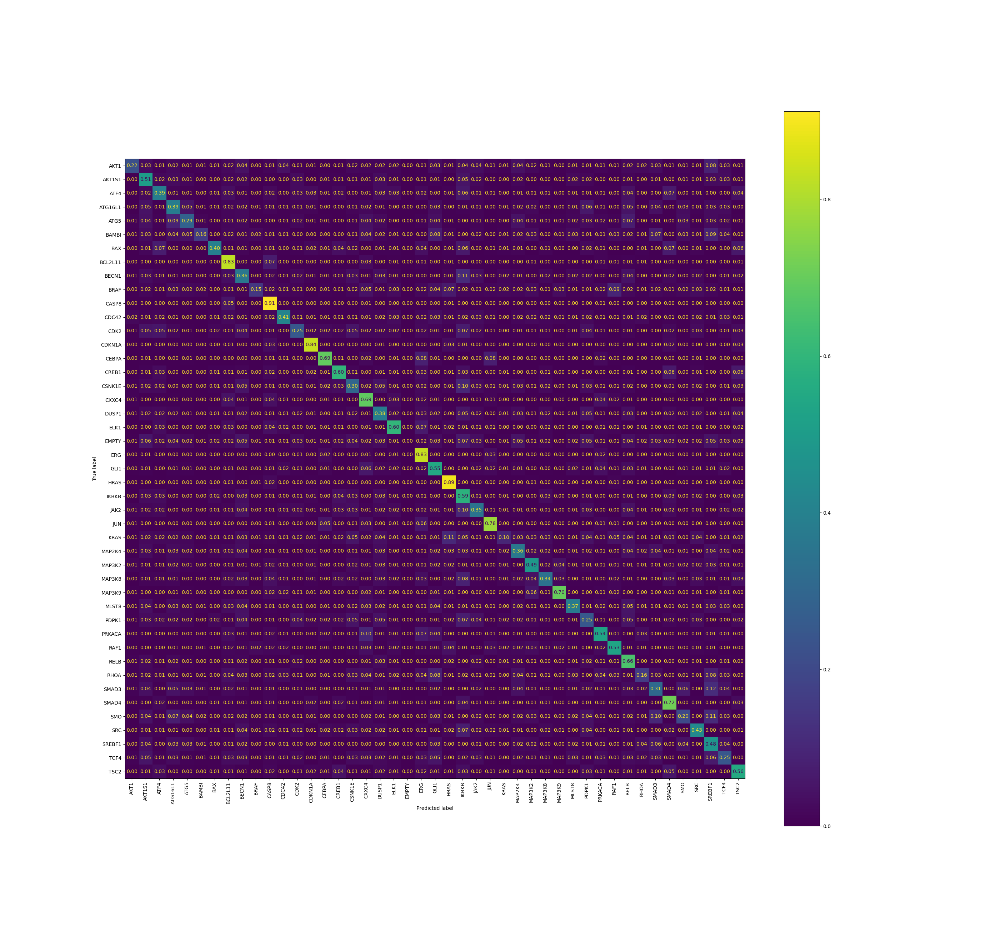

<IPython.core.display.Javascript object>

In [6]:
Image(filename=root_dir + "confusion_matrix_train.png")

#### Confusion matrix for the validation set (20 %)

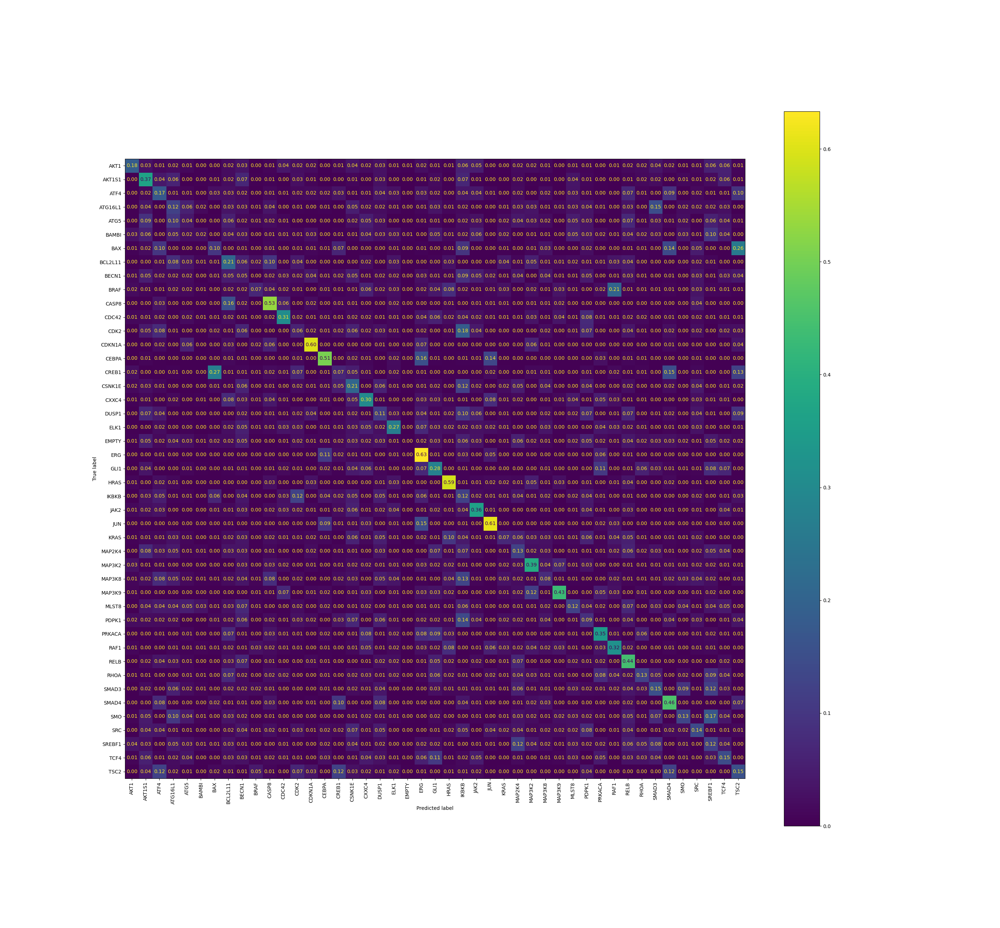

<IPython.core.display.Javascript object>

In [7]:
Image(filename=root_dir + "confusion_matrix_val.png")

#### Confusion matrix for the test set (10%)

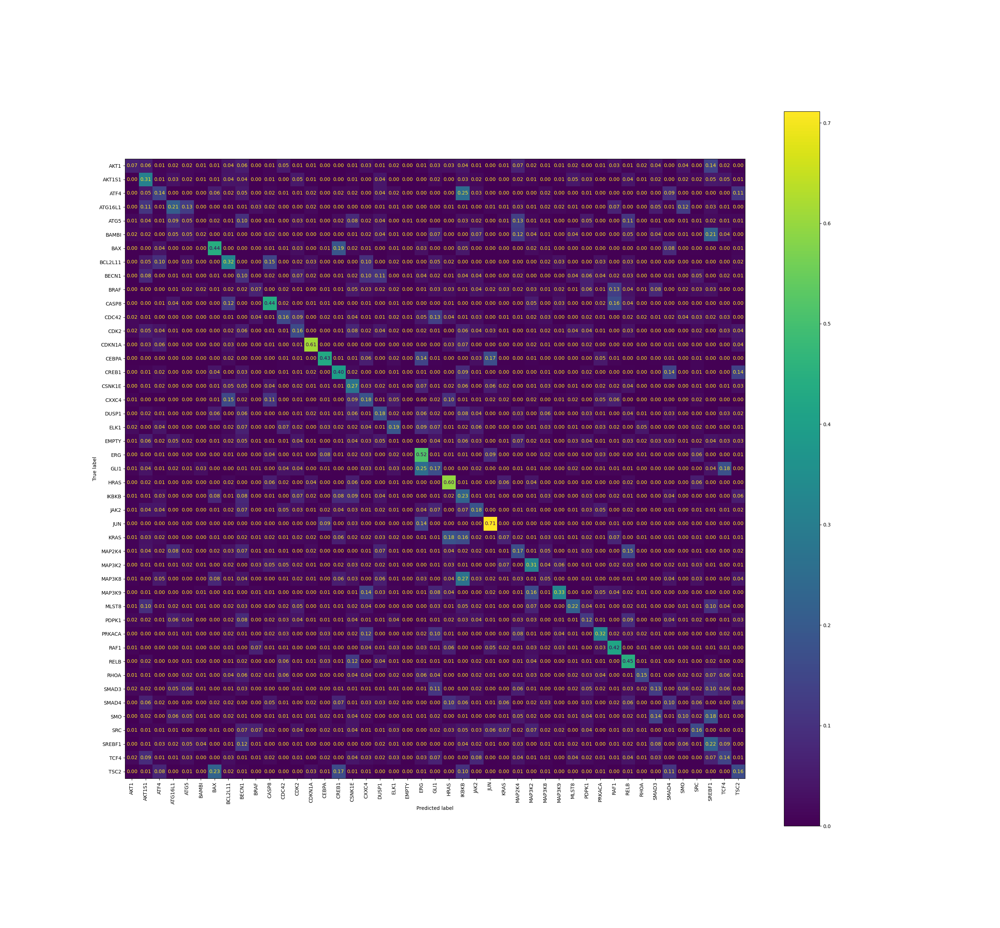

<IPython.core.display.Javascript object>

In [8]:
Image(filename=root_dir + "confusion_matrix_test.png")

---

## 3. Analyses of the image embeddings

To obtain embeddings for the individual images we use the output of the second-to-last layer of the ensemble model, i.e. the output of the model before the final 45 node output layer and before the non-linear activation and batch-normalization that preceeds the output layer.

### 3.1. OE vs negative control

First, we assess the mixing of the overexpression and negative control conditions. We expect most of the OE conditions to give rise to certain structural phenotype that lie within the variability of the negative control population. However, especially toxic OE conditions occupy positions in the latent space outside that region as features such as the cell density can be very different from what is observed in the negative control setting.

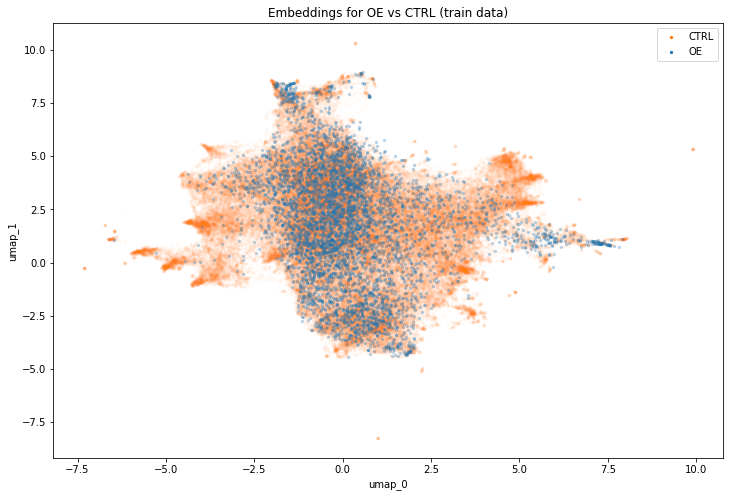

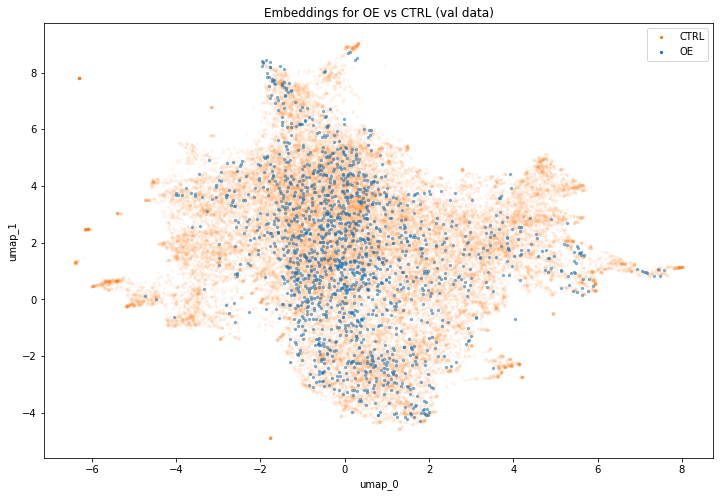

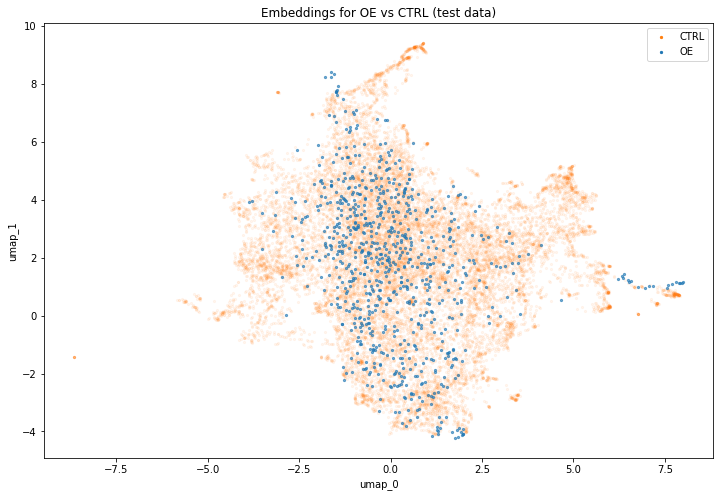

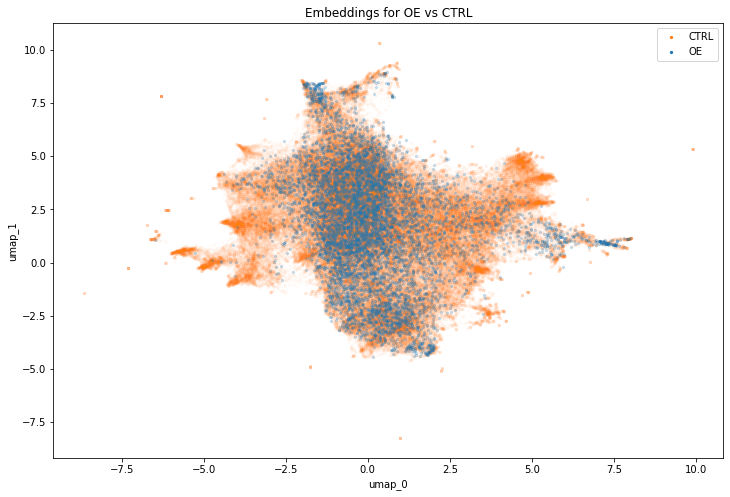

<IPython.core.display.Javascript object>

In [9]:
plot_embs_oe_vs_ctrl(latents, label_dict=label_dict)

### 3.2. Single condition vs rest.

To better understand which OE conditions give rise to which subpopulations in the latent space, we will again use the UMAP plot but color the individual image embeddings from a single OE condition depending on whether the corresponding images were part of the training, validation or test set respectively. The other OE and the negative control condition will be plotted in gray for all different data sets.

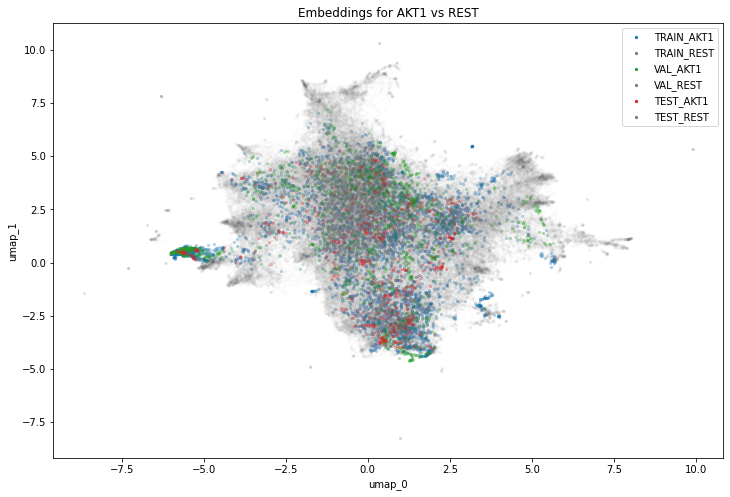

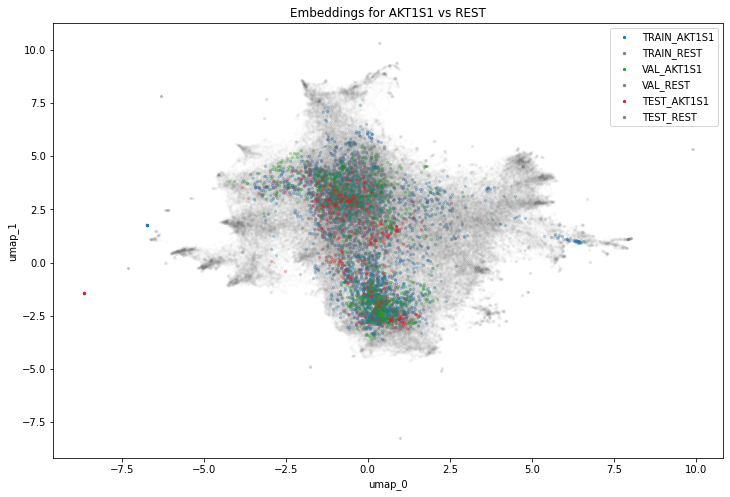

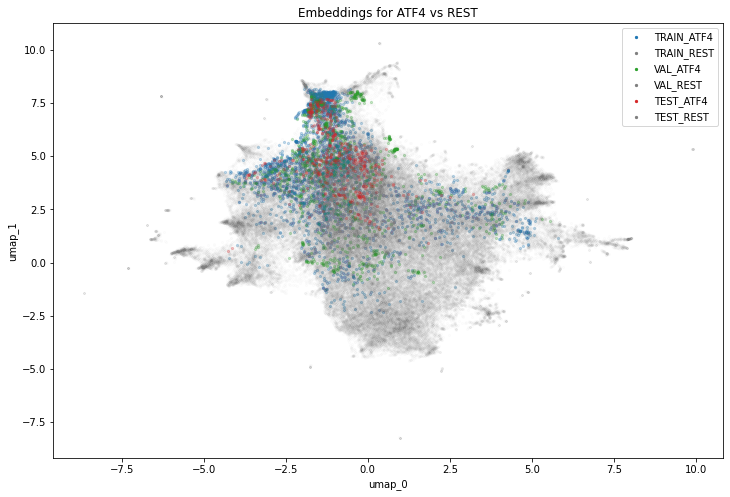

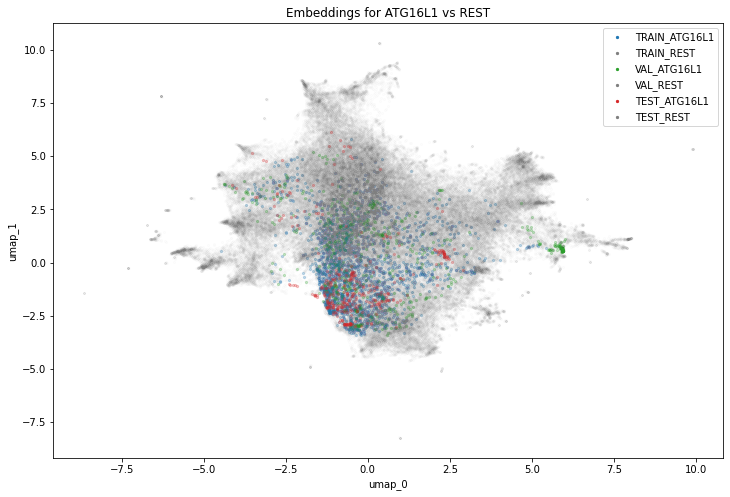

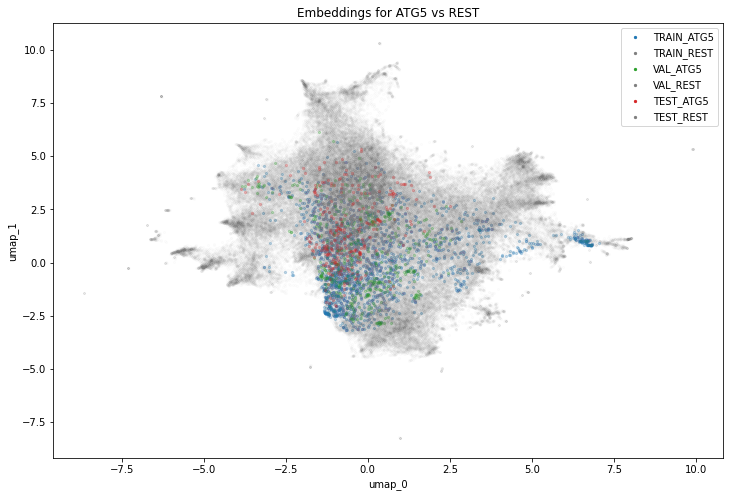

...

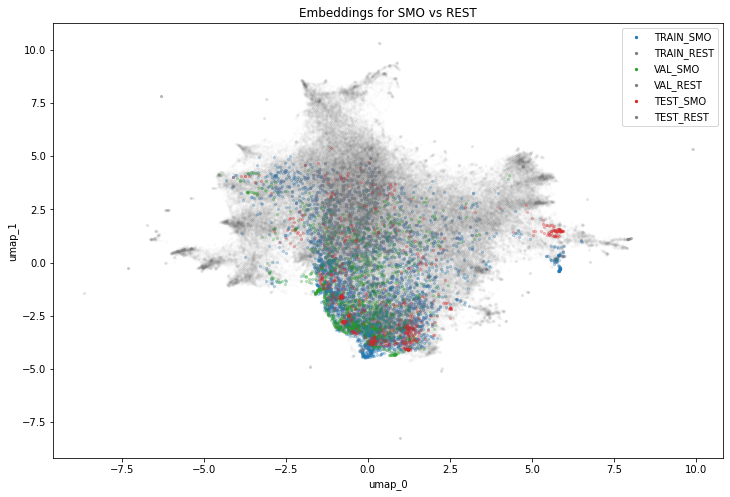

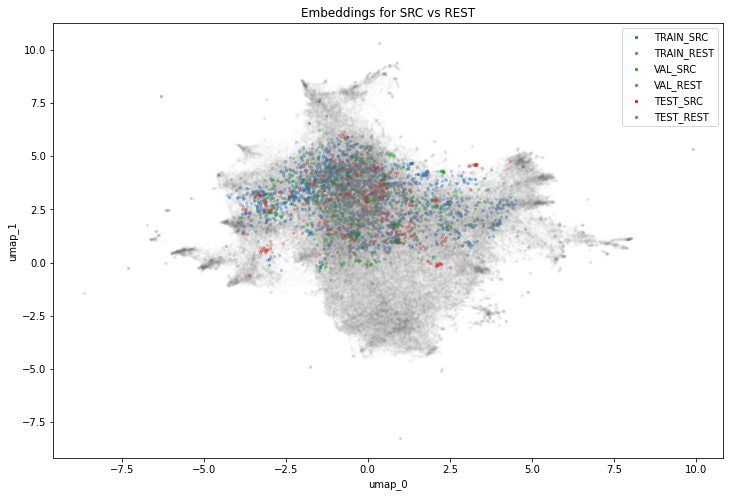

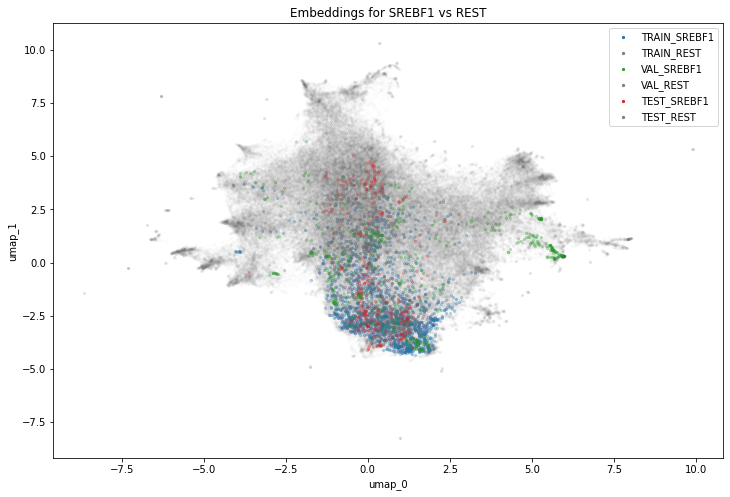

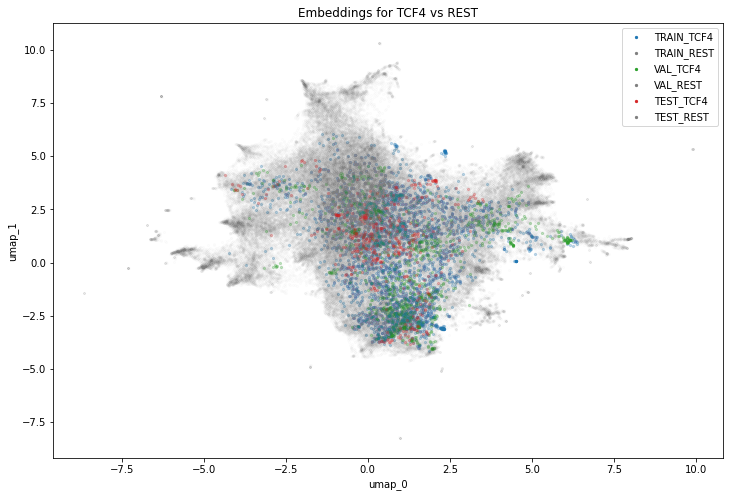

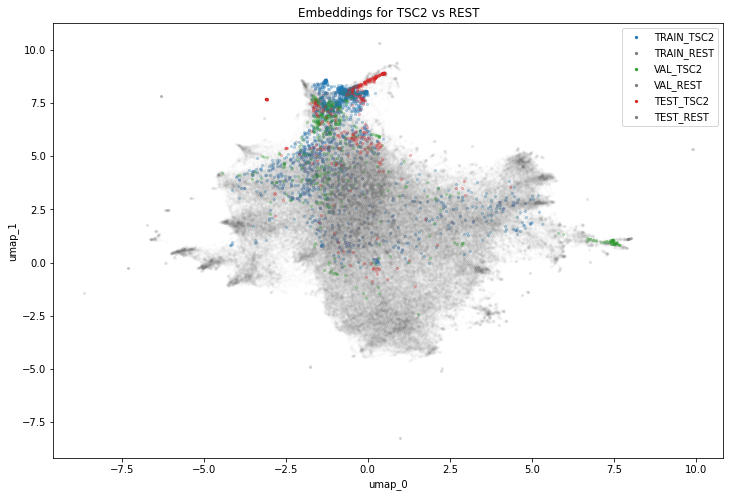

<IPython.core.display.Javascript object>

In [10]:
plot_embs_ovr(latents, label_dict=label_dict)